In [204]:
from torch_geometric_temporal.signal import DynamicGraphTemporalSignal
import torch
import numpy as np

print("✅ Setup successful")
print("Torch:", torch.__version__)
print("NumPy:", np.__version__)


✅ Setup successful
Torch: 2.7.0
NumPy: 2.1.2


In [205]:
import pandas as pd
import yfinance as yf
import os
import re
import numpy as np

In [206]:
# Scrape S&P 500 list from Wikipedia
url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
sp500_table = pd.read_html(url)[0]

# Rename and select needed columns
sp500_table = sp500_table.rename(columns={"Symbol": "Ticker", "Security": "Name"})
sp500_table = sp500_table[["Ticker", "Name", "GICS Sector", "GICS Sub-Industry"]]

# Clean tickers (some use dot notation e.g., BRK.B)
sp500_table["Ticker"] = sp500_table["Ticker"].str.replace(".", "-", regex=False)

sp500_table.to_csv("sp500_companies.csv", index=False)
sp500_table.head()


,Ticker,Name,GICS Sector,GICS Sub-Industry
0,MMM,3M,Industrials,Industrial Conglomerates
1,AOS,A. O. Smith,Industrials,Building Products
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment
3,ABBV,AbbVie,Health Care,Biotechnology
4,ACN,Accenture,Information Technology,IT Consulting & Other Services


In [207]:
from sec_cik_mapper import StockMapper

# Initialize mapper
mapper = StockMapper()

# Access the mapping dictionary directly
ticker_to_cik_map = mapper.ticker_to_cik

# Your tickers
tickers = sp500_table["Ticker"].tolist()

# Map each ticker to CIK (if available)
mapped = []
for ticker in tickers:
    cik = ticker_to_cik_map.get(ticker.upper())  # ensure uppercase match
    if cik:
        mapped.append({"Ticker": ticker, "CIK": str(cik).zfill(10)})

# Create a DataFrame and merge
cik_df = pd.DataFrame(mapped)
sp500_merged = pd.merge(sp500_table, cik_df, on="Ticker", how="left")
sp500_merged = sp500_merged.dropna(subset=["CIK"]).reset_index(drop=True)

sp500_merged.to_csv("sp500_with_cik.csv", index=False)
sp500_merged.head()


,Ticker,Name,GICS Sector,GICS Sub-Industry,CIK
0,MMM,3M,Industrials,Industrial Conglomerates,0000066740
1,AOS,A. O. Smith,Industrials,Building Products,0000091142
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,0000001800
3,ABBV,AbbVie,Health Care,Biotechnology,0001551152
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,0001467373


In [208]:
len(sp500_merged)

503

In [209]:
from sec_edgar_downloader import Downloader

fund_ciks = [
    "0001067983",  # Vanguard
    "0001166559",  # BlackRock
    "0000315066",  # Fidelity
    "0000093751",  # State Street
    "0000914208",  # Invesco
    "0001079114",  # JPMorgan
    "0001103804",  # Capital Research
    "0001282693",  # Geode Capital
    "0000073124",  # Northern Trust
    "0000886982",  # Goldman Sachs
    "0001037389",  # Renaissance
    "0001273087",  # Two Sigma
    "0001423053",  # Citadel
    "0001400522",  # DE Shaw
    "0001239388",  # Millennium
    "0001350694",  # Bridgewater
    "0001608741",  # Point72
    "0001029160",  # Soros
    "0001061768",  # Baupost
]




# Initialize downloader
dl = Downloader("Dhruvin Shah", "dshah309@umd.edu")

# Download all 13F-HR filings after 2022
for cik in fund_ciks:
    print(f"⬇️ Downloading filings for fund CIK: {cik}")
    dl.get("13F-HR", cik, after="2020-01-01")


⬇️ Downloading filings for fund CIK: 0001067983
⬇️ Downloading filings for fund CIK: 0001166559
⬇️ Downloading filings for fund CIK: 0000315066
⬇️ Downloading filings for fund CIK: 0000093751
⬇️ Downloading filings for fund CIK: 0000914208
⬇️ Downloading filings for fund CIK: 0001079114
⬇️ Downloading filings for fund CIK: 0001103804
⬇️ Downloading filings for fund CIK: 0001282693
⬇️ Downloading filings for fund CIK: 0000073124
⬇️ Downloading filings for fund CIK: 0000886982
⬇️ Downloading filings for fund CIK: 0001037389
⬇️ Downloading filings for fund CIK: 0001273087
⬇️ Downloading filings for fund CIK: 0001423053
⬇️ Downloading filings for fund CIK: 0001400522
⬇️ Downloading filings for fund CIK: 0001239388
⬇️ Downloading filings for fund CIK: 0001350694
⬇️ Downloading filings for fund CIK: 0001608741
⬇️ Downloading filings for fund CIK: 0001029160
⬇️ Downloading filings for fund CIK: 0001061768


In [210]:

# List of fund CIKs and corresponding names
fund_ciks = [
    "0001067983",  # Vanguard
    "0001166559",  # BlackRock
    "0000315066",  # Fidelity
    "0000093751",  # State Street
    "0000914208",  # Invesco
    "0001079114",  # JPMorgan
    "0001103804",  # Capital Research
    "0001282693",  # Geode Capital
    "0000073124",  # Northern Trust
    "0000886982",  # Goldman Sachs
    "0001037389",  # Renaissance
    "0001273087",  # Two Sigma
    "0001423053",  # Citadel
    "0001400522",  # DE Shaw
    "0001239388",  # Millennium
    "0001350694",  # Bridgewater
    "0001608741",  # Point72
    "0001029160",  # Soros
    "0001061768",  # Baupost
]

fund_names = [
    "Vanguard",
    "BlackRock",
    "Fidelity",
    "State Street",
    "Invesco",
    "JPMorgan",
    "Capital Research",
    "Geode Capital",
    "Northern Trust",
    "Goldman Sachs",
    "Renaissance",
    "Two Sigma",
    "Citadel",
    "DE Shaw",
    "Millennium",
    "Bridgewater",
    "Point72",
    "Soros",
    "Baupost",
]

# Create the DataFrame
funds_df = pd.DataFrame({
    "fund_cik": fund_ciks,
    "fund_name": fund_names
})

# Export to CSV (adjust path as needed)
funds_df.to_csv("funds.csv", index=False)

print("funds.csv created successfully!")









funds.csv created successfully!


In [211]:
import re
import xml.etree.ElementTree as ET


def extract_acceptance_date_str(content):
    match = re.search(r"<ACCEPTANCE-DATETIME>(\d{8})", content)
    if match:
        return match.group(1)  # e.g., '20240515'
    return None


def parse_13f_submission(file_path, fund_cik, accession_number):
    with open(file_path, "r") as f:
        content = f.read()

    # Extract SEC-reported period
    filing_date = extract_acceptance_date_str(content)

    # Now extract <informationTable>
    start = content.find("<informationTable")
    end = content.find("</informationTable>") + len("</informationTable>")
    if start == -1 or end == -1:
        return []

    xml_str = content[start:end]
    try:
        root = ET.fromstring(xml_str)
    except Exception as e:
        print(f"❌ Parse error in {file_path}: {e}")
        return []

    ns = {"ns": "http://www.sec.gov/edgar/document/thirteenf/informationtable"}
    data = []

    for info in root.findall("ns:infoTable", ns):
        issuer = info.findtext("ns:nameOfIssuer", default="", namespaces=ns)
        cusip = info.findtext("ns:cusip", default="", namespaces=ns)
        value = info.findtext("ns:value", default="", namespaces=ns)
        shares = info.findtext("ns:shrsOrPrnAmt/ns:sshPrnamt", default="", namespaces=ns)

        if issuer and cusip and value and shares:
            data.append({
                "fund_cik": fund_cik,
                "accession_number": accession_number,
                "filing_date": filing_date,
                "issuer": issuer.strip(),
                "cusip": cusip.strip(),
                "value_1000s": float(value),
                "shares": float(shares),
                "source_file": os.path.basename(file_path)
            })

    return data


In [212]:
base_dir = "sec-edgar-filings"

all_data = []

for fund_cik in fund_ciks:
    cik_path = os.path.join(base_dir, fund_cik, "13F-HR")
    if not os.path.exists(cik_path):
        continue

    for accession_folder in os.listdir(cik_path):
        file_path = os.path.join(cik_path, accession_folder, "full-submission.txt")
        if os.path.exists(file_path):
            print(f"📄 {fund_cik} | {accession_folder}")
            records = parse_13f_submission(file_path, fund_cik, accession_folder)
            all_data.extend(records)

# Final DataFrame
df_all_13f = pd.DataFrame(all_data)
print(f"\n✅ Total parsed holdings: {len(df_all_13f)}")
df_all_13f.head()


📄 0001067983 | 0000950123-20-009058
📄 0001067983 | 0000950123-23-010898
📄 0001067983 | 0000950123-22-006442
📄 0001067983 | 0000950123-21-007024
📄 0001067983 | 0000950123-22-009450
📄 0001067983 | 0000950123-25-002701
📄 0001067983 | 0000950123-23-005270
📄 0001067983 | 0000950123-22-002973
📄 0001067983 | 0000950123-20-002466
📄 0001067983 | 0000950123-24-005622
📄 0001067983 | 0000950123-25-005701
📄 0001067983 | 0000950123-22-012275
📄 0001067983 | 0000950123-24-002518
📄 0001067983 | 0000950123-20-005345
📄 0001067983 | 0000950123-21-015518
📄 0001067983 | 0000950123-24-011775
📄 0001067983 | 0000950123-20-012127
📄 0001067983 | 0000950123-21-011396
📄 0001067983 | 0000950123-21-002786
📄 0001067983 | 0000950123-23-002585
📄 0001067983 | 0000950123-23-008074
📄 0001067983 | 0000950123-24-008740
📄 0001166559 | 0001104659-23-091369
📄 0001166559 | 0001104659-22-118573
📄 0001166559 | 0001104659-23-021739
📄 0001166559 | 0001104659-20-095545
📄 0001166559 | 0001104659-21-068010
📄 0001166559 | 0001104659-22

,fund_cik,accession_number,filing_date,issuer,cusip,value_1000s,shares,source_file
0,0001067983,0000950123-20-009058,20200814,AMAZON COM INC,023135106,1157325.0,419500.0,full-submission.txt
1,0001067983,0000950123-20-009058,20200814,AMAZON COM INC,023135106,313954.0,113800.0,full-submission.txt
2,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,185844.0,1952142.0,full-submission.txt
3,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,1639858.0,17225400.0,full-submission.txt
4,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,79952.0,839832.0,full-submission.txt


In [213]:
from tqdm import tqdm

# List of tickers from your matched company table
tickers = sp500_merged["Ticker"].tolist()

# Fetch metadata for each company
company_meta = []

for ticker in tqdm(tickers):
    try:
        info = yf.Ticker(ticker).info
        company_meta.append({
            "Ticker": ticker,
            "longName": info.get("longName"),
            "sector": info.get("sector"),
            "industry": info.get("industry"),
            "marketCap": info.get("marketCap"),
            "country": info.get("country"),
            "fullTimeEmployees": info.get("fullTimeEmployees")
        })
    except Exception as e:
        print(f"Error fetching for {ticker}: {e}")

# Merge back into your main company table
meta_df = pd.DataFrame(company_meta)
sp500_enriched = pd.merge(sp500_merged, meta_df, on="Ticker", how="left")

sp500_enriched.head()


100%|██████████| 503/503 [01:24<00:00,  5.97it/s]


,Ticker,Name,GICS Sector,GICS Sub-Industry,CIK,longName,sector,industry,marketCap,country,fullTimeEmployees
0,MMM,3M,Industrials,Industrial Conglomerates,0000066740,3M Company,Industrials,Conglomerates,82400894976,United States,61500.0
1,AOS,A. O. Smith,Industrials,Building Products,0000091142,A. O. Smith Corporation,Industrials,Specialty Industrial Machinery,10021525504,United States,12700.0
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,0000001800,Abbott Laboratories,Healthcare,Medical Devices,234530439168,United States,114000.0
3,ABBV,AbbVie,Health Care,Biotechnology,0001551152,AbbVie Inc.,Healthcare,Drug Manufacturers - General,325052923904,United States,55000.0
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,0001467373,Accenture plc,Technology,Information Technology Services,198882197504,Ireland,801000.0


In [214]:
df_all_13f.head(20)

,fund_cik,accession_number,filing_date,issuer,cusip,value_1000s,shares,source_file
0,0001067983,0000950123-20-009058,20200814,AMAZON COM INC,023135106,1157325.0,419500.0,full-submission.txt
1,0001067983,0000950123-20-009058,20200814,AMAZON COM INC,023135106,313954.0,113800.0,full-submission.txt
2,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,185844.0,1952142.0,full-submission.txt
3,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,1639858.0,17225400.0,full-submission.txt
4,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,79952.0,839832.0,full-submission.txt
5,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,195836.0,2057100.0,full-submission.txt
6,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,761089.0,7994634.0,full-submission.txt
7,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,11437507.0,120141879.0,full-submission.txt
8,0001067983,0000950123-20-009058,20200814,AMERICAN EXPRESS CO,025816109,133253.0,1399713.0,full-submission.txt
9,0001067983,0000950123-20-009058,20200814,APPLE INC,037833100,63110.0,173000.0,full-submission.txt


In [215]:
df_agg = df_all_13f.groupby(["fund_cik", "issuer", "accession_number","cusip","filing_date"], as_index=False).agg({
    "shares": "sum",
    "value_1000s": "sum"
})


In [216]:
df_agg.sort_values(by="filing_date").head(20)

,fund_cik,issuer,accession_number,cusip,filing_date,shares,value_1000s
24054,0000093751,CREE INC,0000093751-20-000012,225447101,20200206,2828131.0,130518.0
27167,0000093751,DOLLAR GEN CORP NEW,0000093751-20-000012,256677105,20200206,11349258.0,1770257.0
48486,0000093751,JOUNCE THERAPEUTICS INC,0000093751-20-000012,481116101,20200206,408691.0,3568.0
4739,0000093751,AMEREN CORP,0000093751-20-000012,023608102,20200206,13236258.0,1016545.0
19170,0000093751,CHEMOCENTRYX INC,0000093751-20-000012,16383L106,20200206,1050619.0,41552.0
4727,0000093751,AMERCO,0000093751-20-000012,023586100,20200206,249627.0,93938.0
87327,0000093751,TRECORA RES,0000093751-20-000012,894648104,20200206,414593.0,2964.0
84561,0000093751,TAYLOR MORRISON HOME CORP,0000093751-20-000012,87724P106,20200206,3101411.0,67797.0
16534,0000093751,CANADIAN SOLAR INC,0000093751-20-000012,136635109,20200206,68596.0,1516.0
48507,0000093751,JOYY INC,0000093751-20-000012,46591M109,20200206,1190853.0,62865.0


In [217]:
len(df_all_13f)

1467511

In [218]:
cik_ticker_df = pd.read_csv("CIK_with_Tickers.csv", delimiter="|")

In [219]:
cik_ticker_df.head()

,CIK,Company_Name,Ticker,Exchange
0,320193,Apple Inc.,AAPL,Nasdaq
1,789019,MICROSOFT CORP,MSFT,Nasdaq
2,1018724,AMAZON COM INC,AMZN,Nasdaq
3,1067983,BERKSHIRE HATHAWAY INC,BRK-B,NYSE
4,731766,UNITEDHEALTH GROUP INC,UNH,NYSE


In [220]:
cusip_map_df = pd.read_csv("cik-cusip-maps.csv")

In [134]:
# Ensure CIK column is numeric and convert to integer
cusip_map_df['cik'] = pd.to_numeric(cusip_map_df['cik'], errors='coerce').astype('Int64')


In [221]:
cusip_map_df.head()

,cik,cusip6,cusip8
0,828119.0,88343A,88343A10
1,1342575.0,M8260H,M8260H10
2,1323143.0,61732R,61732R10
3,856751.0,320655,32065510
4,1373079.0,018921,01892110


In [222]:
# Display column names to verify
print("cusip_map_df columns:", cusip_map_df.columns)
print("cik_ticker_df columns:", cik_ticker_df.columns)


cusip_map_df columns: Index(['cik', 'cusip6', 'cusip8'], dtype='object')
cik_ticker_df columns: Index(['CIK', 'Company_Name', 'Ticker', 'Exchange'], dtype='object')


In [223]:
# Standardize column names
cusip_map_df.rename(columns=lambda x: x.strip().lower(), inplace=True)
cik_ticker_df.rename(columns=lambda x: x.strip().lower(), inplace=True)


In [224]:
# Merge the two dataframes
merged_df = pd.merge(cusip_map_df, cik_ticker_df, on='cik', how='inner')

# Display the merged dataframe
merged_df.head()


,cik,cusip6,cusip8,company_name,ticker,exchange
0,771856.0,999994,999994,"CHAMPIONS ONCOLOGY, INC.",CSBR,Nasdaq
1,733269.0,005125,00512510,"LiveRamp Holdings, Inc.",RAMP,NYSE
2,830656.0,74112E,74112E10,PRESSURE BIOSCIENCES INC,PBIO,OTC
3,100726.0,904677,90467710,UNIFI INC,UFI,NYSE
4,1113809.0,120076,12007610,BUILD-A-BEAR WORKSHOP INC,BBW,NYSE


In [225]:
df_agg["cusip8"] = df_agg["cusip"].astype(str).str[:8]

# Now merge on cusip8
df_agg = pd.merge(df_agg, merged_df, on='cusip8', how='left')


In [226]:
df_agg['filing_date'].unique()

array(['20210517', '20210816', '20211115', '20220214', '20220516',
       '20220815', '20221115', '20230214', '20230515', '20230814',
       '20231114', '20240515', '20240814', '20241114', '20250214',
       '20250515', '20200206', '20200511', '20200814', '20201110',
       '20210216', '20210514', '20210813', '20220513', '20220812',
       '20221110', '20230213', '20230511', '20230811', '20231113',
       '20240213', '20240813', '20250213', '20250512', '20240513',
       '20241113', '20200207', '20200514', '20200813', '20201113',
       '20210208', '20211110', '20210212', '20200214', '20200515',
       '20200812', '20221114', '20230512', '20240212', '20240514',
       '20241112', '20201116', '20220211', '20211112', '20240214',
       '20210513', '20210210', '20240809', '20250514', '20200212',
       '20200213', '20200513', '20200807', '20220811'], dtype=object)

In [227]:
# Convert the filing_date column to datetime
df_agg['filing_date'] = pd.to_datetime(df_agg['filing_date'], format='%Y%m%d')

# Extract the quarter in the format 'YYYYQn'
df_agg['filing_quarter'] = df_agg['filing_date'].dt.to_period('Q').astype(str)


In [142]:
df_agg.head()

,fund_cik,issuer,accession_number,cusip,filing_date,shares,value_1000s,cusip8,cik,cusip6,company_name,ticker,exchange,filing_quarter
0,0000093751,1 800 FLOWERS COM INC,0000093751-21-000556,68243Q106,2021-05-17,760896.0,21008.0,68243Q10,1084869,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q2
1,0000093751,1 800 FLOWERS COM INC,0000093751-21-000640,68243Q106,2021-08-16,827517.0,26373.0,68243Q10,1084869,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q3
2,0000093751,1 800 FLOWERS COM INC,0000093751-21-000697,68243Q106,2021-11-15,781137.0,23832.0,68243Q10,1084869,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q4
3,0000093751,1 800 FLOWERS COM INC,0000093751-22-000401,68243Q106,2022-02-14,827323.0,19335.0,68243Q10,1084869,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2022Q1
4,0000093751,1 800 FLOWERS COM INC,0000093751-22-000509,68243Q106,2022-05-16,826860.0,10551.0,68243Q10,1084869,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2022Q2


In [228]:
df_agg['ownership_pctile'] = df_agg.groupby('filing_quarter')['value_1000s'].rank(pct=True)

In [229]:
df_agg.head()

,fund_cik,issuer,accession_number,cusip,filing_date,shares,value_1000s,cusip8,cik,cusip6,company_name,ticker,exchange,filing_quarter,ownership_pctile
0,0000093751,1 800 FLOWERS COM INC,0000093751-21-000556,68243Q106,2021-05-17,760896.0,21008.0,68243Q10,1084869.0,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q2,0.635215
1,0000093751,1 800 FLOWERS COM INC,0000093751-21-000640,68243Q106,2021-08-16,827517.0,26373.0,68243Q10,1084869.0,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q3,0.674957
2,0000093751,1 800 FLOWERS COM INC,0000093751-21-000697,68243Q106,2021-11-15,781137.0,23832.0,68243Q10,1084869.0,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2021Q4,0.666574
3,0000093751,1 800 FLOWERS COM INC,0000093751-22-000401,68243Q106,2022-02-14,827323.0,19335.0,68243Q10,1084869.0,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2022Q1,0.645639
4,0000093751,1 800 FLOWERS COM INC,0000093751-22-000509,68243Q106,2022-05-16,826860.0,10551.0,68243Q10,1084869.0,68243Q,1 800 FLOWERS COM INC,FLWS,Nasdaq,2022Q2,0.584260


In [230]:
sp500_enriched.head()

,Ticker,Name,GICS Sector,GICS Sub-Industry,CIK,longName,sector,industry,marketCap,country,fullTimeEmployees
0,MMM,3M,Industrials,Industrial Conglomerates,0000066740,3M Company,Industrials,Conglomerates,82400894976,United States,61500.0
1,AOS,A. O. Smith,Industrials,Building Products,0000091142,A. O. Smith Corporation,Industrials,Specialty Industrial Machinery,10021525504,United States,12700.0
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,0000001800,Abbott Laboratories,Healthcare,Medical Devices,234530439168,United States,114000.0
3,ABBV,AbbVie,Health Care,Biotechnology,0001551152,AbbVie Inc.,Healthcare,Drug Manufacturers - General,325052923904,United States,55000.0
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,0001467373,Accenture plc,Technology,Information Technology Services,198882197504,Ireland,801000.0


In [231]:
fundHoldingsFinal = df_agg.rename(columns={
    'value_1000s': 'value',
})[
    ['fund_cik', 'filing_quarter', 'shares', 'value',
     'ownership_pctile', 'company_name','cusip', 'ticker', 'exchange']
].copy()


In [232]:
fundHoldingsFinal.head()

,fund_cik,filing_quarter,shares,value,ownership_pctile,company_name,cusip,ticker,exchange
0,0000093751,2021Q2,760896.0,21008.0,0.635215,1 800 FLOWERS COM INC,68243Q106,FLWS,Nasdaq
1,0000093751,2021Q3,827517.0,26373.0,0.674957,1 800 FLOWERS COM INC,68243Q106,FLWS,Nasdaq
2,0000093751,2021Q4,781137.0,23832.0,0.666574,1 800 FLOWERS COM INC,68243Q106,FLWS,Nasdaq
3,0000093751,2022Q1,827323.0,19335.0,0.645639,1 800 FLOWERS COM INC,68243Q106,FLWS,Nasdaq
4,0000093751,2022Q2,826860.0,10551.0,0.584260,1 800 FLOWERS COM INC,68243Q106,FLWS,Nasdaq


In [233]:
fundHoldingsFinal.isnull().sum()

fund_cik                 0
filing_quarter           0
shares                   0
value                    0
ownership_pctile         0
company_name        216514
cusip                    0
ticker              216514
exchange            216599
dtype: int64

In [234]:
# Filter rows where company metadata is missing
missing_company_info = fundHoldingsFinal[fundHoldingsFinal['company_name'].isna()]

# Show unique CUSIPs missing info
missing_cusips = missing_company_info['cusip'].unique()

# Display count and sample
print(f"Total missing CUSIPs: {len(missing_cusips)}")
print(missing_cusips[:10])  # show first 10


Total missing CUSIPs: 11373
['G87077106' '81807M205' '81807M304' '31986N102' '320551104' '90137F202'
 '90138Q108' '90138Q306' '901384107' '90214JAB7']


In [235]:
fundHoldingsFinal.dropna(inplace=True)

In [236]:
# Sort for correct lag computation
fundHoldingsFinal = fundHoldingsFinal.sort_values(by=['fund_cik', 'cusip', 'filing_quarter'])

# Grouped shift to get previous quarter values
fundHoldingsFinal['prev_value'] = fundHoldingsFinal.groupby(['fund_cik', 'cusip'])['value'].shift(1)
fundHoldingsFinal['prev_shares'] = fundHoldingsFinal.groupby(['fund_cik', 'cusip'])['shares'].shift(1)
fundHoldingsFinal['prev_pctile'] = fundHoldingsFinal.groupby(['fund_cik', 'cusip'])['ownership_pctile'].shift(1)

# Impute missing previous values with current value (first entry per group)
fundHoldingsFinal['prev_value'] = fundHoldingsFinal['prev_value'].fillna(fundHoldingsFinal['value'])
fundHoldingsFinal['prev_shares'] = fundHoldingsFinal['prev_shares'].fillna(fundHoldingsFinal['shares'])
fundHoldingsFinal['prev_pctile'] = fundHoldingsFinal['prev_pctile'].fillna(fundHoldingsFinal['ownership_pctile'])

# Compute changes (will be zero for first entry)
fundHoldingsFinal['delta_value'] = fundHoldingsFinal['value'] - fundHoldingsFinal['prev_value']
fundHoldingsFinal['delta_shares'] = fundHoldingsFinal['shares'] - fundHoldingsFinal['prev_shares']
fundHoldingsFinal['delta_pctile'] = fundHoldingsFinal['ownership_pctile'] - fundHoldingsFinal['prev_pctile']

# Flag new holdings (first record per group)
fundHoldingsFinal['is_new_holding'] = (
    fundHoldingsFinal['value'] == fundHoldingsFinal['prev_value']
).astype(int)


In [237]:
fundHoldingsFinal.head()

,fund_cik,filing_quarter,shares,value,ownership_pctile,company_name,cusip,ticker,exchange,prev_value,prev_shares,prev_pctile,delta_value,delta_shares,delta_pctile,is_new_holding
518,0000093751,2020Q1,1191022.0,58848.0,0.752749,"AAON, INC.",000360206,AAON,Nasdaq,58848.0,1191022.0,0.752749,0.0,0.0,0.000000,1
519,0000093751,2020Q1,1191022.0,58848.0,0.752749,"EMCOR Group, Inc.",000360206,EME,NYSE,58848.0,1191022.0,0.752749,0.0,0.0,0.000000,1
520,0000093751,2020Q2,1252366.0,60514.0,0.800108,"AAON, INC.",000360206,AAON,Nasdaq,58848.0,1191022.0,0.752749,1666.0,61344.0,0.047359,0
521,0000093751,2020Q2,1252366.0,60514.0,0.800108,"EMCOR Group, Inc.",000360206,EME,NYSE,60514.0,1252366.0,0.800108,0.0,0.0,0.000000,1
522,0000093751,2020Q3,1248901.0,68038.0,0.788990,"AAON, INC.",000360206,AAON,Nasdaq,60514.0,1252366.0,0.800108,7524.0,-3465.0,-0.011118,0


In [238]:
len(fundHoldingsFinal)

507863

In [239]:
sp500final = sp500_enriched.rename(columns={
    'Ticker': 'ticker',
    'longName': 'name',
    'CIK': 'company_cik',
    'marketCap': 'marketcap',
    'fullTimeEmployees': 'fulltimeEmployees'
})[
    ['ticker', 'name', 'company_cik', 'sector', 'industry', 'marketcap', 'country', 'fulltimeEmployees']
].copy()


In [156]:
sp500final

,ticker,name,company_cik,sector,industry,marketcap,country,fulltimeEmployees
0,MMM,3M Company,0000066740,Industrials,Conglomerates,82400894976,United States,61500.0
1,AOS,A. O. Smith Corporation,0000091142,Industrials,Specialty Industrial Machinery,10021525504,United States,12700.0
2,ABT,Abbott Laboratories,0000001800,Healthcare,Medical Devices,234530439168,United States,114000.0
3,ABBV,AbbVie Inc.,0001551152,Healthcare,Drug Manufacturers - General,325052923904,United States,55000.0
4,ACN,Accenture plc,0001467373,Technology,Information Technology Services,198882197504,Ireland,801000.0
...,...,...,...,...,...,...,...,...
498,XYL,Xylem Inc.,0001524472,Industrials,Specialty Industrial Machinery,31156230144,United States,23000.0
499,YUM,"Yum! Brands, Inc.",0001041061,Consumer Cyclical,Restaurants,41158279168,United States,40000.0
500,ZBRA,Zebra Technologies Corporation,0000877212,Technology,Communication Equipment,15287819264,United States,9900.0
501,ZBH,"Zimmer Biomet Holdings, Inc.",0001136869,Healthcare,Medical Devices,19181363200,United States,17000.0


In [240]:
# Bin marketcap
sp500final['marketcap_bucket'] = pd.qcut(sp500final['marketcap'], q=3, labels=['SmallCap', 'MidCap', 'LargeCap'])

# Bin employees (handle missing safely)
sp500final['employee_bucket'] = pd.qcut(sp500final['fulltimeEmployees'].fillna(0), q=3, labels=['SmallTeam', 'MidTeam', 'LargeTeam'])


In [241]:
# Create time index
quarter_order = {q: i for i, q in enumerate(sorted(fundHoldingsFinal['filing_quarter'].unique()))}
fundHoldingsFinal['quarter_idx'] = fundHoldingsFinal['filing_quarter'].map(quarter_order)


In [242]:
# --- STEP 1: BIN FEATURES IN sp500final ----------------------------

sp500final['marketcap_bucket'] = pd.qcut(sp500final['marketcap'], q=3, labels=['SmallCap', 'MidCap', 'LargeCap'])
sp500final['employee_bucket'] = pd.qcut(sp500final['fulltimeEmployees'].fillna(0), q=3, labels=['SmallTeam', 'MidTeam', 'LargeTeam'])

# --- STEP 2: ASSIGN NODE IDs ---------------------------------------

# Companies by ticker
company_nodes = sp500final[['ticker']].drop_duplicates().copy()
company_nodes['node_type'] = 'company'
company_nodes['node_id'] = pd.factorize(company_nodes['ticker'])[0]

# Funds by fund_cik
fund_nodes = fundHoldingsFinal[['fund_cik']].drop_duplicates().copy()
fund_nodes['node_type'] = 'fund'
fund_nodes['node_id'] = pd.factorize(fund_nodes['fund_cik'])[0] + company_nodes['node_id'].max() + 1

# Combine node list
company_nodes = company_nodes.rename(columns={'ticker': 'entity_id'})
fund_nodes = fund_nodes.rename(columns={'fund_cik': 'entity_id'})
nodes_df = pd.concat([company_nodes, fund_nodes], ignore_index=True)

# --- STEP 3: ADD FEATURE NODES -------------------------------------

feature_fields = ['sector', 'industry', 'country', 'marketcap_bucket', 'employee_bucket']
next_node_id = nodes_df['node_id'].max() + 1
feature_nodes = []

for field in feature_fields:
    temp = sp500final[[field]].dropna().drop_duplicates().copy()
    temp['node_type'] = field
    temp['entity_id'] = temp[field].astype(str)
    temp['node_id'] = range(next_node_id, next_node_id + len(temp))
    next_node_id += len(temp)
    feature_nodes.append(temp[['entity_id', 'node_type', 'node_id']])

feature_nodes_df = pd.concat(feature_nodes, ignore_index=True)
nodes_df = pd.concat([nodes_df, feature_nodes_df], ignore_index=True)

# --- STEP 4: TEMPORAL FUND → COMPANY EDGES -------------------------

# Encode quarter index
quarter_order = {q: i for i, q in enumerate(sorted(fundHoldingsFinal['filing_quarter'].unique()))}
fundHoldingsFinal['quarter_idx'] = fundHoldingsFinal['filing_quarter'].map(quarter_order)

# Merge fund node_id
fundHoldingsFinal = fundHoldingsFinal.merge(
    fund_nodes[['entity_id', 'node_id']].rename(columns={'entity_id': 'fund_cik', 'node_id': 'fund_node_id'}),
    on='fund_cik', how='left'
)

# Merge company node_id via ticker
fundHoldingsFinal = fundHoldingsFinal.merge(
    company_nodes[['entity_id', 'node_id']].rename(columns={'entity_id': 'ticker', 'node_id': 'company_node_id'}),
    on='ticker', how='left'
)

# Final temporal edge list
edges_temporal = fundHoldingsFinal[[
    'fund_node_id', 'company_node_id', 'quarter_idx',
    'value', 'delta_value', 'delta_shares', 'delta_pctile'
]].dropna()

edges_temporal.columns = ['src', 'dst', 't', 'value', 'delta_value', 'delta_shares', 'delta_pctile']
edges_temporal['edge_type'] = 'fund_to_company'


In [243]:
edges_static = []

# Use the same list of fields as used for feature nodes
for field in feature_fields:
    # 1. Create a mapping from feature value to feature node_id
    feature_mapping = feature_nodes_df[feature_nodes_df['node_type'] == field][['entity_id', 'node_id']]
    feature_mapping = feature_mapping.rename(columns={'entity_id': field, 'node_id': 'feature_node_id'})

    # 2. Merge with sp500final to get company + feature node_id
    mapping = sp500final[['ticker', field]].dropna().merge(
        feature_mapping, on=field, how='left'
    )

    # 3. Merge with company_nodes to get company node_id
    mapping = mapping.merge(
        company_nodes[['entity_id', 'node_id']].rename(columns={'entity_id': 'ticker', 'node_id': 'company_node_id'}),
        on='ticker', how='left'
    )

    # 4. Build edge DataFrame
    edge_df = mapping[['company_node_id', 'feature_node_id']].dropna()
    edge_df.columns = ['src', 'dst']
    edge_df['t'] = 0  # static edge
    edge_df['edge_type'] = f'company_to_{field}'

    edges_static.append(edge_df)

# Combine all static edges
edges_static_df = pd.concat(edges_static, ignore_index=True)


In [244]:
all_edges_df = pd.concat([edges_temporal, edges_static_df], ignore_index=True)


In [245]:
all_edges_df.head()

,src,dst,t,value,delta_value,delta_shares,delta_pctile,edge_type
0,503,8.0,0,2036589.0,0.0,0.0,0.000000,fund_to_company
1,503,8.0,1,1241749.0,-794840.0,-2232814.0,-0.003159,fund_to_company
2,503,8.0,2,1286228.0,44479.0,-567208.0,-0.002546,fund_to_company
3,503,8.0,3,1234607.0,-51621.0,-1734402.0,-0.002045,fund_to_company
4,503,8.0,4,1516760.0,282153.0,143082.0,0.002709,fund_to_company


In [246]:
nodes_df.head()

,entity_id,node_type,node_id
0,MMM,company,0
1,AOS,company,1
2,ABT,company,2
3,ABBV,company,3
4,ACN,company,4


In [247]:
len(all_edges_df)

69579

In [248]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_graph_for_quarter(edges_df, nodes_df, quarter_idx, max_edges=200):
    # Filter temporal and static edges
    temporal = edges_df[(edges_df['t'] == quarter_idx) & (edges_df['edge_type'] == 'fund_to_company')]
    static = edges_df[(edges_df['t'] == 0) & (edges_df['edge_type'].str.startswith('company_to_'))]

    # Limit edges to make visualization clearer
    if max_edges:
        temporal = temporal.sample(min(max_edges, len(temporal)), random_state=42)

    # Combine with relevant static feature edges
    feature_edges = static[static['src'].isin(temporal['dst'])]

    # Subgraph nodes
    sub_nodes = set(temporal['src']).union(temporal['dst']).union(feature_edges['dst'])

    # Build graph
    G = nx.DiGraph()
    for _, row in pd.concat([temporal, feature_edges]).iterrows():
        G.add_edge(row['src'], row['dst'], type=row['edge_type'])

    # Node labels
    node_labels = dict(zip(nodes_df['node_id'], nodes_df['entity_id']))
    node_types = dict(zip(nodes_df['node_id'], nodes_df['node_type']))

    # Positioning
    pos = nx.spring_layout(G, seed=42)

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, nodelist=list(sub_nodes), node_size=80,
                           node_color=['lightblue' if node_types.get(n)=='company' else
                                       'orange' if node_types.get(n)=='fund' else
                                       'lightgreen' for n in sub_nodes])

    # Draw edges
    nx.draw_networkx_edges(G, pos, arrows=True, width=0.6)

    # Draw labels (optional: can slow things down)
    nx.draw_networkx_labels(G, pos, labels={n: node_labels.get(n, '') for n in sub_nodes}, font_size=6)

    plt.title(f"Graph Snapshot - Quarter {quarter_idx}")
    plt.axis('off')
    plt.show()


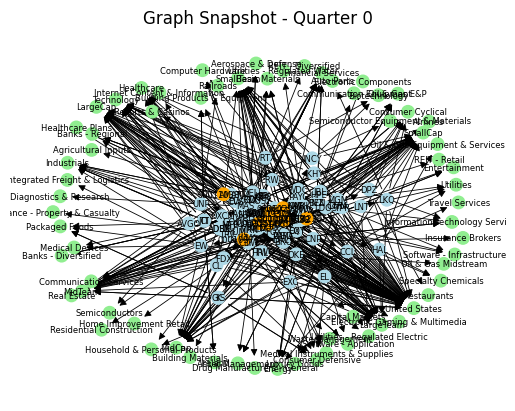

In [249]:
plot_graph_for_quarter(all_edges_df, nodes_df, quarter_idx=0, max_edges=100)


In [250]:
from matplotlib.animation import FuncAnimation

In [251]:
def animate_temporal_graph(edges_df, nodes_df, max_edges=100, interval=1000):
    # Get all available quarters
    quarters = sorted(edges_df[edges_df['edge_type'] == 'fund_to_company']['t'].unique())

    # Set up the plot
    fig, ax = plt.subplots(figsize=(10, 7))
    plt.axis('off')

    # Node data
    node_labels = dict(zip(nodes_df['node_id'], nodes_df['entity_id']))
    node_types = dict(zip(nodes_df['node_id'], nodes_df['node_type']))

    def update(frame):
        ax.clear()
        plt.axis('off')
        quarter_idx = quarters[frame]

        # Filter edges
        temporal = edges_df[(edges_df['t'] == quarter_idx) & (edges_df['edge_type'] == 'fund_to_company')]
        static = edges_df[(edges_df['t'] == 0) & (edges_df['edge_type'].str.startswith('company_to_'))]

        if max_edges:
            temporal = temporal.sample(min(max_edges, len(temporal)), random_state=42)

        feature_edges = static[static['src'].isin(temporal['dst'])]
        sub_nodes = set(temporal['src']).union(temporal['dst']).union(feature_edges['dst'])

        # Build graph
        G = nx.DiGraph()
        for _, row in pd.concat([temporal, feature_edges]).iterrows():
            G.add_edge(row['src'], row['dst'], type=row['edge_type'])

        pos = nx.spring_layout(G, seed=42)

        # Draw nodes
        nx.draw_networkx_nodes(
            G, pos, nodelist=list(sub_nodes), node_size=80,
            node_color=[
                'lightblue' if node_types.get(n) == 'company' else
                'orange' if node_types.get(n) == 'fund' else
                'lightgreen'
                for n in sub_nodes
            ],
            ax=ax
        )

        # Draw edges
        nx.draw_networkx_edges(G, pos, arrows=True, width=0.6, ax=ax)

        # Draw labels (optional)
        nx.draw_networkx_labels(G, pos,
                                labels={n: node_labels.get(n, '') for n in sub_nodes},
                                font_size=6, ax=ax)

        ax.set_title(f"Quarter {quarter_idx}", fontsize=12)

    # Create animation
    anim = FuncAnimation(fig, update, frames=len(quarters), interval=interval, repeat=True)
    plt.close()  # prevents duplicate plot display in notebooks
    return anim


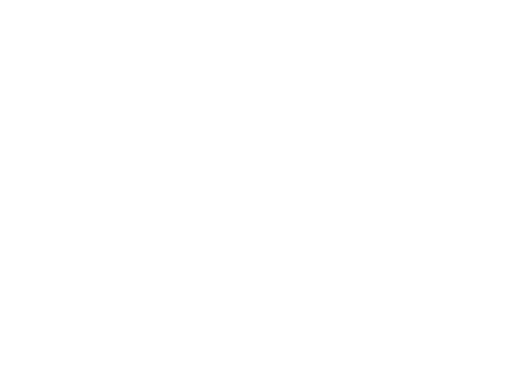

In [171]:
from IPython.display import HTML

anim = animate_temporal_graph(all_edges_df, nodes_df, max_edges=100, interval=1500)
HTML(anim.to_jshtml())


In [172]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from sklearn.cluster import KMeans


In [252]:
# 1) Define your masks
temporal_mask = all_edges_df['edge_type'] == 'fund_to_company'
static_mask   = ~temporal_mask

static_df = all_edges_df[static_mask]
temp_df   = all_edges_df[temporal_mask]

# 2) Precompute the static adjacency (NumPy)
static_ei = np.vstack([
    static_df['src'].to_numpy(),
    static_df['dst'].to_numpy()
])               # shape [2 × E_static]
static_ea = static_df[['value','delta_value','delta_shares','delta_pctile']].to_numpy()
                  # shape [E_static × F]

# 3) Build per-snapshot (t) edge lists, stacking static + temporal
edge_indices, edge_weights = [], []
for t in sorted(temp_df['t'].unique()):
    snap = temp_df[temp_df['t'] == t]
    dyn_ei = np.vstack([snap['src'].to_numpy(), snap['dst'].to_numpy()])
    dyn_ea = snap[['value','delta_value','delta_shares','delta_pctile']].to_numpy()

    # include static edges in every snapshot
    ei = np.hstack([static_ei, dyn_ei])    # [2 × (E_static+E_dyn)]
    ea = np.vstack([static_ea, dyn_ea])    # [(E_static+E_dyn) × F]

    edge_indices.append(ei)
    edge_weights.append(ea)

# 4) Dummy node-features (one-hot identity)
num_nodes = int(nodes_df['node_id'].max()) + 1
x_np = np.eye(num_nodes)                  # [N × N]

features = [x_np for _ in edge_indices]   # same features every step
targets  = [x_np for _ in edge_indices]   # placeholder for unsupervised

# 5) Build the DynamicGraphTemporalSignal
dataset = DynamicGraphTemporalSignal(
    edge_indices=edge_indices,
    edge_weights=edge_weights,
    features=features,
    targets=targets,
)

print(dataset)

In [258]:
# ─── 1) Pull out the last snapshot ────────────────────────────────────────────
# (we assume you already have `dataset = DynamicGraphTemporalSignal(...)`)
edge_index = torch.tensor(dataset.edge_indices[-1], dtype=torch.long)  # [2×E]
x_np       = dataset.features[-1]                                     # [N×D]
x          = torch.from_numpy(x_np).float()

In [259]:
# ─── 2) Define a small 2-layer GAT encoder ─────────────────────────────────
class GATEncoder(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4):
        super().__init__()
        # first layer: heads parallel attention, concatenated
        self.conv1 = GATConv(in_channels, hidden_channels, heads=heads, concat=True)
        # second layer: single head, no concat → final embedding size = out_channels
        self.conv2 = GATConv(hidden_channels * heads, out_channels, heads=1, concat=False)
    def forward(self, x, edge_index):
        x = F.elu(self.conv1(x, edge_index))
        return self.conv2(x, edge_index)

In [260]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = GATEncoder(
    in_channels = x.shape[1],   # your node‐feature dim (here N if one‐hot, else D)
    hidden_channels = 32,
    out_channels    = 64,
    heads = 4
).to(device)
opt = torch.optim.Adam(model.parameters(), lr=0.005)

In [261]:
model.train()
for epoch in range(1, 101):
    opt.zero_grad()
    h = model(x.to(device), edge_index.to(device))           # [N×64]

    src, dst = edge_index
    pos_score = (h[src] * h[dst]).sum(dim=1)                  # [E]

    # draw one negative sample per positive edge
    num_pos = pos_score.size(0)
    idx = torch.randint(0, h.size(0), (num_pos,), device=device)
    jdx = torch.randint(0, h.size(0), (num_pos,), device=device)
    neg_score = (h[idx] * h[jdx]).sum(dim=1)

    logits = torch.cat([pos_score, neg_score], dim=0)
    labels = torch.cat([torch.ones_like(pos_score),
                        torch.zeros_like(neg_score)], dim=0)

    loss = F.binary_cross_entropy_with_logits(logits, labels)
    loss.backward()
    opt.step()

    if epoch % 20 == 0:
        print(f"Epoch {epoch:3d} / 100 — loss: {loss.item():.4f}")

Epoch  20 / 100 — loss: 0.6383
Epoch  40 / 100 — loss: 0.6274
Epoch  60 / 100 — loss: 0.5668
Epoch  80 / 100 — loss: 0.5185
Epoch 100 / 100 — loss: 0.5073


In [262]:
model.eval()
h_final = model(x.to(device), edge_index.to(device)).detach().cpu().numpy()  # [N×64]


In [293]:
from torch_geometric.nn import GATConv
import torch.nn.functional as F
import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm
import pandas as pd

# --- GAT Encoder Model ---
class GATEncoder(torch.nn.Module):
    def __init__(self, in_dim, hid_dim, out_dim, heads=4, dropout=0.2):
        super().__init__()
        self.gat1 = GATConv(in_dim, hid_dim, heads=heads, dropout=dropout)
        self.gat2 = GATConv(hid_dim * heads, out_dim, heads=1, concat=False, dropout=dropout)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = F.elu(self.gat1(x, edge_index))
        x = F.dropout(x, p=self.dropout, training=self.training)
        return self.gat2(x, edge_index)

# --- Train on Temporal Graph ---
def train_on_temporal(model, dataset, device, lr=1e-3, weight_decay=5e-4, epochs=10):
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for snapshot in dataset:
            x = snapshot.x.clone().detach().to(torch.float32).to(device)
            edge_index = snapshot.edge_index.clone().detach().to(torch.long).to(device)

            h = model(x, edge_index)
            src, dst = edge_index

            pos_score = (h[src] * h[dst]).sum(dim=1)

            # Negative samples
            num_pos = pos_score.size(0)
            idx = torch.randint(0, h.size(0), (num_pos,), device=device)
            jdx = torch.randint(0, h.size(0), (num_pos,), device=device)
            neg_score = (h[idx] * h[jdx]).sum(dim=1)

            logits = torch.cat([pos_score, neg_score], dim=0)
            labels = torch.cat([torch.ones_like(pos_score), torch.zeros_like(neg_score)], dim=0)

            loss = F.binary_cross_entropy_with_logits(logits, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            total_loss += loss.item()
        if epoch % 5 == 0:
            print(f"Epoch {epoch:3d}, Loss: {total_loss:.4f}")
    return model

# --- Evaluation ---
def evaluate_embeddings(model, dataset, device, use_last_snapshot=True):
    model.eval()
    with torch.no_grad():
        if use_last_snapshot:
            snapshot = list(dataset)[-1]
            x = snapshot.x.clone().detach().to(torch.float32).to(device)
            edge_index = snapshot.edge_index.clone().detach().to(torch.long).to(device)
            h = model(x, edge_index).cpu().numpy()
        else:
            h_list = []
            for snapshot in dataset:
                x = snapshot.x.clone().detach().to(torch.float32).to(device)
                edge_index = snapshot.edge_index.clone().detach().to(torch.long).to(device)
                h = model(x, edge_index).cpu().numpy()
                h_list.append(h)
            h = np.mean(np.stack(h_list), axis=0)

    labels = KMeans(n_clusters=5, random_state=42).fit_predict(h)
    score = silhouette_score(h, labels)
    return score

# --- Grid Search ---
param_grid = {
    "lr": [1e-3, 5e-4],
    "dropout": [0.2, 0.5],
    "hidden_dim": [32, 64],
    "heads": [2, 4]
}

best_score = -1
best_model = None
best_config = None
results = []

for lr in param_grid["lr"]:
    for dropout in param_grid["dropout"]:
        for hidden_dim in param_grid["hidden_dim"]:
            for heads in param_grid["heads"]:
                print(f"\n🔍 Config: lr={lr}, dropout={dropout}, hidden={hidden_dim}, heads={heads}")

                model = GATEncoder(
                    in_dim=dataset.features[0].shape[1],
                    hid_dim=hidden_dim,
                    out_dim=64,
                    heads=heads,
                    dropout=dropout
                )

                model = train_on_temporal(model, dataset, device, lr=lr, epochs=10)
                score = evaluate_embeddings(model, dataset, device)
                print(f"Silhouette Score: {score:.4f}")

                results.append({
                    "lr": lr,
                    "dropout": dropout,
                    "hidden_dim": hidden_dim,
                    "heads": heads,
                    "score": score
                })

                if score > best_score:
                    best_score = score
                    best_config = {
                        "lr": lr,
                        "dropout": dropout,
                        "hidden_dim": hidden_dim,
                        "heads": heads
                    }
                    best_model = model

# --- Show Results ---
results_df = pd.DataFrame(results).sort_values(by="score", ascending=False)
print("\n🏆 Best Config:", best_config)
print("🎯 Best Silhouette Score:", best_score)
display(results_df)



🔍 Config: lr=0.001, dropout=0.2, hidden=32, heads=2
Epoch   0, Loss: 15.1891
Epoch   5, Loss: 14.9281
Silhouette Score: 0.6095

🔍 Config: lr=0.001, dropout=0.2, hidden=32, heads=4
Epoch   0, Loss: 15.1979
Epoch   5, Loss: 14.9896
Silhouette Score: 0.5831

🔍 Config: lr=0.001, dropout=0.2, hidden=64, heads=2
Epoch   0, Loss: 15.1661
Epoch   5, Loss: 14.9596
Silhouette Score: 0.5587

🔍 Config: lr=0.001, dropout=0.2, hidden=64, heads=4
Epoch   0, Loss: 15.1474
Epoch   5, Loss: 14.9464
Silhouette Score: 0.5224

🔍 Config: lr=0.001, dropout=0.5, hidden=32, heads=2
Epoch   0, Loss: 15.3878
Epoch   5, Loss: 15.2587
Silhouette Score: 0.3476

🔍 Config: lr=0.001, dropout=0.5, hidden=32, heads=4
Epoch   0, Loss: 15.4776
Epoch   5, Loss: 15.2563
Silhouette Score: 0.4383

🔍 Config: lr=0.001, dropout=0.5, hidden=64, heads=2
Epoch   0, Loss: 15.4108
Epoch   5, Loss: 15.2249
Silhouette Score: 0.4847

🔍 Config: lr=0.001, dropout=0.5, hidden=64, heads=4
Epoch   0, Loss: 15.5941
Epoch   5, Loss: 15.2240
S

,lr,dropout,hidden_dim,heads,score
0,0.0010,0.2,32,2,0.609457
1,0.0010,0.2,32,4,0.583076
10,0.0005,0.2,64,2,0.573434
11,0.0005,0.2,64,4,0.571674
9,0.0005,0.2,32,4,0.571220
2,0.0010,0.2,64,2,0.558669
8,0.0005,0.2,32,2,0.526989
3,0.0010,0.2,64,4,0.522420
6,0.0010,0.5,64,2,0.484692
7,0.0010,0.5,64,4,0.445678


In [264]:
df_embeddings = pd.DataFrame(h_final)

In [265]:
nodes_df['node_type'].unique()

array(['company', 'fund', 'sector', 'industry', 'country',
       'marketcap_bucket', 'employee_bucket'], dtype=object)

In [266]:
df_embeddings.to_csv("company_embeddings.csv")

In [267]:
df_embeddings = pd.read_csv("company_embeddings.csv", index_col=0)
h_final = pd.DataFrame()
h_final = df_embeddings.values

In [268]:
len(h_final)

655

In [269]:
clusters = KMeans(n_clusters=5, random_state=42).fit_predict(h_final)
nodes_df['cluster'] = clusters

In [186]:
print(nodes_df[['node_id','cluster']].head())

   node_id  cluster
0        0        2
1        1        2
2        2        0
3        3        0
4        4        0


Community/Cluster Discovery

In [270]:
# all companies in cluster 2
comm = nodes_df.query("cluster == 2 and node_type=='company'")
print(comm['entity_id'].tolist())


['MMM', 'AOS', 'AES', 'AFL', 'A', 'APD', 'AKAM', 'ALB', 'ARE', 'LNT', 'AMCR', 'AEE', 'AEP', 'AWK', 'AMGN', 'APH', 'ADI', 'ANSS', 'APTV', 'ADM', 'ANET', 'AJG', 'ATO', 'ADSK', 'ADP', 'AVB', 'AVY', 'AXON', 'BALL', 'BAC', 'BRK-B', 'BBY', 'TECH', 'BIIB', 'BLK', 'BA', 'BR', 'BRO', 'BXP', 'CHRW', 'CDNS', 'CZR', 'KMX', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CNP', 'CF', 'CRL', 'CINF', 'CME', 'CMS', 'ED', 'CEG', 'CPRT', 'GLW', 'CRWD', 'CCI', 'CMI', 'DHR', 'DAY', 'DE', 'DELL', 'D', 'DPZ', 'DASH', 'DOW', 'DTE', 'DUK', 'ETN', 'ECL', 'EIX', 'EA', 'EMR', 'ENPH', 'ETR', 'EPAM', 'EQT', 'EFX', 'EQR', 'ERIE', 'ESS', 'EG', 'EVRG', 'ES', 'EXC', 'EXR', 'FDS', 'FICO', 'FAST', 'FRT', 'FITB', 'F', 'FTV', 'BEN', 'FCX', 'GRMN', 'GE', 'GEHC', 'GEV', 'GNRC', 'GM', 'GPC', 'HAL', 'HAS', 'DOC', 'HES', 'HLT', 'HD', 'HWM', 'HUM', 'IBM', 'IEX', 'IR', 'INTC', 'ICE', 'IFF', 'IP', 'INTU', 'INVH', 'IQV', 'IRM', 'JBL', 'J', 'JNPR', 'KEY', 'KEYS', 'KIM', 'KMI', 'LHX', 'LH', 'LRCX', 'LVS', 'LIN', 'LYV', 'LMT', 'L', 'LOW', 'LULU', 'LYB

In [271]:
sp500_enriched.head()

,Ticker,Name,GICS Sector,GICS Sub-Industry,CIK,longName,sector,industry,marketCap,country,fullTimeEmployees
0,MMM,3M,Industrials,Industrial Conglomerates,0000066740,3M Company,Industrials,Conglomerates,82400894976,United States,61500.0
1,AOS,A. O. Smith,Industrials,Building Products,0000091142,A. O. Smith Corporation,Industrials,Specialty Industrial Machinery,10021525504,United States,12700.0
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,0000001800,Abbott Laboratories,Healthcare,Medical Devices,234530439168,United States,114000.0
3,ABBV,AbbVie,Health Care,Biotechnology,0001551152,AbbVie Inc.,Healthcare,Drug Manufacturers - General,325052923904,United States,55000.0
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,0001467373,Accenture plc,Technology,Information Technology Services,198882197504,Ireland,801000.0


In [272]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from IPython.display import display

# ─── 0) Make sure you still have these in memory ─────────────────────────────
# h_final   : numpy array [N×D] of your final node embeddings
# nodes_df  : DataFrame with ['entity_id','node_type','node_id']
# sp500_enriched : your enriched SP500 table

# ─── 1) (Re-)fit KMeans so we have cluster_centers_ ─────────────────────────
n_clusters = 5
kmeans     = KMeans(n_clusters=n_clusters, random_state=42).fit(h_final)
clusters   = kmeans.labels_

nodes_df['cluster'] = clusters

# ─── 2) Pull out company nodes & their embeddings ────────────────────────────
company_nodes = nodes_df[nodes_df['node_type']=='company'].copy()
idxs   = company_nodes['node_id'].values         # indices into h_final
emb    = h_final[idxs]                           # [M×D]
labels = clusters[idxs]                          # [M]

# ─── 3) Compute each’s distance to its cluster centroid ────────────────────
centroids = kmeans.cluster_centers_              # [C×D]
dists     = np.linalg.norm(emb - centroids[labels], axis=1)
company_nodes['dist_to_centroid'] = dists

# ─── 4) Grab the 15 most central companies per cluster ──────────────────────
top_list = []
for cl in sorted(company_nodes['cluster'].unique()):
    core15 = (
        company_nodes[company_nodes['cluster']==cl]
        .nsmallest(15, 'dist_to_centroid')
        .merge(sp500_enriched, left_on='entity_id', right_on='Ticker', how='left')
        .loc[:, ['cluster','Ticker','Name','GICS Sector','marketCap','dist_to_centroid']]
    )
    top_list.append(core15)

top_df = pd.concat(top_list).reset_index(drop=True)

# ─── 5) Display it with Jupyter’s built-in display() ────────────────────────
display(top_df)


,cluster,Ticker,Name,GICS Sector,marketCap,dist_to_centroid
0,0,CTRA,Coterra,Energy,18928871424,0.158228
1,0,PARA,Paramount Global,Communication Services,8328457728,0.264041
2,0,META,Meta Platforms,Communication Services,1610026188800,0.264101
3,0,MTCH,Match Group,Communication Services,7172831232,0.264104
4,0,CAH,Cardinal Health,Health Care,36815925248,0.264104
5,0,C,Citigroup,Financials,141424525312,0.264104
6,0,T,AT&T,Communication Services,199462027264,0.264109
7,0,MOH,Molina Healthcare,Health Care,17633427456,0.264117
8,0,PYPL,PayPal,Financials,70197428224,0.264117
9,0,JBHT,J.B. Hunt,Industrials,14685760512,0.264120


In [273]:
top_df.to_csv('top.csv')

In [274]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# 1) Pull out only the company nodes
company_nodes = nodes_df[nodes_df['node_type']=='company'].reset_index(drop=True)
company_ids   = company_nodes['node_id'].values       # [M]
H_companies   = h_final[company_ids]                  # [M×D]

# 2) Build a cosine-similarity matrix
S = cosine_similarity(H_companies)                    # [M×M]

# 3) Function to get top-k competitors for a ticker
def get_competitors(ticker, k=10):
    # find its position in our small companies list
    row = company_nodes.index[company_nodes['entity_id']==ticker][0]
    sims = S[row].copy()
    sims[row] = -1                                      # ignore self
    top = sims.argsort()[::-1][:k]
    return company_nodes.loc[top, ['entity_id','cluster']]

# Example:
print(get_competitors("AAPL", k=5))


    entity_id  cluster
22       AMZN        0
468      VRSN        0
279        KR        0
326       MCO        0
431      TMUS        0


In [275]:
def get_overlap_competitors(ticker, k=5):
    """
    Returns the top-k competitor tickers for the given company,
    based on the number of shared funds (investors).
    """
    import networkx as nx
    from networkx.algorithms import bipartite

    # 1. Use the latest quarter's data
    latest_t = all_edges_df['t'].max()
    latest_df = all_edges_df[all_edges_df['t'] == latest_t]

    # 2. Map internal node IDs to actual entity IDs (CIK or ticker)
    fund_id2cik = dict(zip(fund_nodes['node_id'], fund_nodes['entity_id']))
    comp_id2tkr = dict(zip(company_nodes['node_id'], company_nodes['entity_id']))

    # 3. Build bipartite graph (funds ↔ companies)
    B = nx.Graph()
    B.add_nodes_from(fund_nodes['entity_id'], bipartite='fund')
    B.add_nodes_from(company_nodes['entity_id'], bipartite='company')

    for _, row in latest_df.iterrows():
        cik = fund_id2cik[row['src']]
        tkr = comp_id2tkr[row['dst']]
        B.add_edge(cik, tkr)

    # 4. Project to company-company graph, where edge weight = shared fund count
    companies = [n for n, d in B.nodes(data=True) if d['bipartite'] == 'company']
    Gc = bipartite.weighted_projected_graph(B, companies)

    # 5. Return top-k neighbors by shared fund count
    if ticker not in Gc:
        return []

    neighbors = Gc[ticker]
    top_k = sorted(neighbors.items(), key=lambda x: -x[1]['weight'])[:k]

    return [(n, d['weight']) for n, d in top_k]


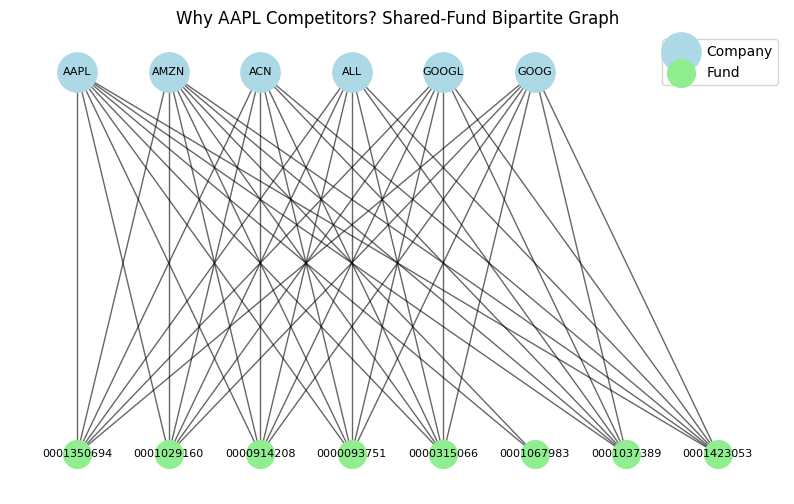

In [276]:
import networkx as nx
import matplotlib.pyplot as plt

# 1) Parameters & get competitors
query = "AAPL"
competitors = get_overlap_competitors(query, k=5)
companies = [query] + [t for t,_ in competitors]

# 2) Find all funds that hold any of those companies (latest quarter)
latest_t = all_edges_df['t'].max()
latest = all_edges_df[all_edges_df['t']==latest_t]

# map node_id → entity_id for funds and companies
fund_id2cik = dict(zip(fund_nodes['node_id'], fund_nodes['entity_id']))
comp_id2tkr = dict(zip(company_nodes['node_id'], company_nodes['entity_id']))

# gather relevant funds
relevant_funds = set()
for _, row in latest.iterrows():
    if comp_id2tkr[row['dst']] in companies:
        relevant_funds.add(fund_id2cik[row['src']])

# 3) Build bipartite subgraph
B_sub = nx.Graph()
B_sub.add_nodes_from(companies, bipartite='company')
B_sub.add_nodes_from(relevant_funds, bipartite='fund')

for _, row in latest.iterrows():
    cik = fund_id2cik[row['src']]
    tkr = comp_id2tkr[row['dst']]
    if tkr in companies:
        B_sub.add_edge(cik, tkr)

# 4) Layout: companies on top, funds on bottom
pos = {}
pos.update( (c, (i*2, 1)) for i,c in enumerate(companies) )
pos.update( (f, (i*2, 0)) for i,f in enumerate(relevant_funds) )

# 5) Draw it
plt.figure(figsize=(10,6))
nx.draw_networkx_nodes(B_sub, pos,
                       nodelist=companies, node_color='lightblue', node_size=800, label='Company')
nx.draw_networkx_nodes(B_sub, pos,
                       nodelist=list(relevant_funds), node_color='lightgreen', node_size=400, label='Fund')
nx.draw_networkx_edges(B_sub, pos, alpha=0.6)
nx.draw_networkx_labels(B_sub, pos, font_size=8)

plt.legend(scatterpoints=1)
plt.axis('off')
plt.title(f"Why {query} Competitors? Shared-Fund Bipartite Graph")
plt.show()


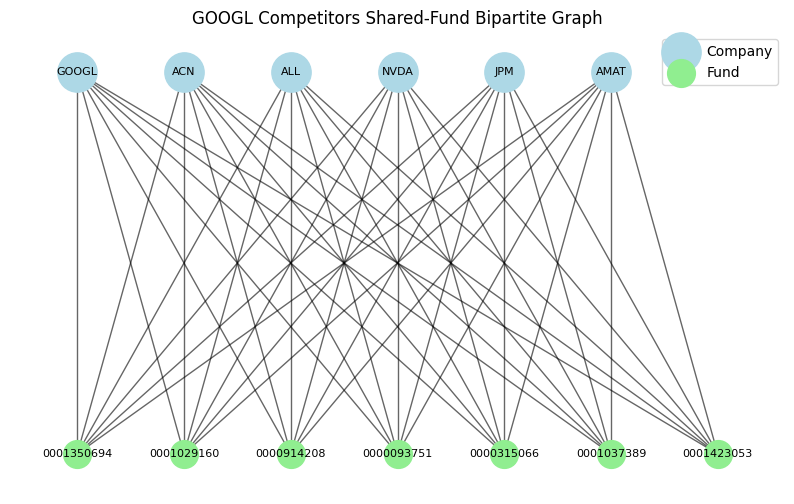

In [277]:
import networkx as nx
import matplotlib.pyplot as plt

# 1) Parameters & get competitors
query = "GOOGL"
competitors = get_overlap_competitors(query, k=5)
companies = [query] + [t for t,_ in competitors]

# 2) Find all funds that hold any of those companies (latest quarter)
latest_t = all_edges_df['t'].max()
latest = all_edges_df[all_edges_df['t']==latest_t]

# map node_id → entity_id for funds and companies
fund_id2cik = dict(zip(fund_nodes['node_id'], fund_nodes['entity_id']))
comp_id2tkr = dict(zip(company_nodes['node_id'], company_nodes['entity_id']))

# gather relevant funds
relevant_funds = set()
for _, row in latest.iterrows():
    if comp_id2tkr[row['dst']] in companies:
        relevant_funds.add(fund_id2cik[row['src']])

# 3) Build bipartite subgraph
B_sub = nx.Graph()
B_sub.add_nodes_from(companies, bipartite='company')
B_sub.add_nodes_from(relevant_funds, bipartite='fund')

for _, row in latest.iterrows():
    cik = fund_id2cik[row['src']]
    tkr = comp_id2tkr[row['dst']]
    if tkr in companies:
        B_sub.add_edge(cik, tkr)

# 4) Layout: companies on top, funds on bottom
pos = {}
pos.update( (c, (i*2, 1)) for i,c in enumerate(companies) )
pos.update( (f, (i*2, 0)) for i,f in enumerate(relevant_funds) )

# 5) Draw it
plt.figure(figsize=(10,6))
nx.draw_networkx_nodes(B_sub, pos,
                       nodelist=companies, node_color='lightblue', node_size=800, label='Company')
nx.draw_networkx_nodes(B_sub, pos,
                       nodelist=list(relevant_funds), node_color='lightgreen', node_size=400, label='Fund')
nx.draw_networkx_edges(B_sub, pos, alpha=0.6)
nx.draw_networkx_labels(B_sub, pos, font_size=8)

plt.legend(scatterpoints=1)
plt.axis('off')
plt.title(f"{query} Competitors Shared-Fund Bipartite Graph")
plt.show()


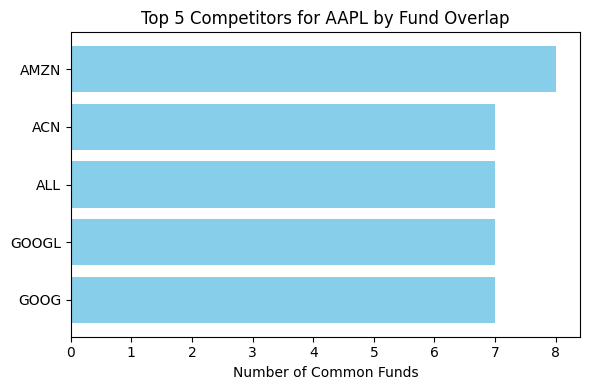

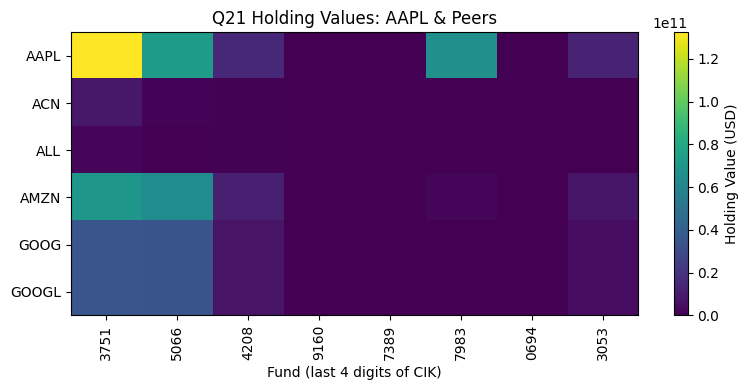

In [278]:
import networkx as nx
from networkx.algorithms import bipartite
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# — prepare mappings & latest-quarter data —
latest_t   = all_edges_df['t'].max()
latest_df  = all_edges_df[all_edges_df['t'] == latest_t].copy()
fund_id2cik = dict(zip(fund_nodes['node_id'],    fund_nodes['entity_id']))
comp_id2tkr = dict(zip(company_nodes['node_id'], company_nodes['entity_id']))

# — 1) Build unweighted bipartite and project for counts —
B_count = nx.Graph()
B_count.add_nodes_from(fund_nodes['entity_id'],    bipartite='fund')
B_count.add_nodes_from(company_nodes['entity_id'], bipartite='company')
for _, row in latest_df.iterrows():
    cik = fund_id2cik[row['src']]
    tkr = comp_id2tkr[row['dst']]
    B_count.add_edge(cik, tkr)

company_list = [n for n,d in B_count.nodes(data=True) if d['bipartite']=='company']
Gc_count    = bipartite.weighted_projected_graph(B_count, company_list)

def get_count_competitors(tkr, k=5):
    if tkr not in Gc_count:
        return []
    neigh = Gc_count[tkr]
    top   = sorted(neigh.items(), key=lambda x: -x[1]['weight'])[:k]
    return [(n, d['weight']) for n,d in top]

# — 2) Compute top-5 competitors by shared-fund count —
query       = "AAPL"
counts      = get_count_competitors(query, k=5)
df_counts   = pd.DataFrame(counts, columns=['Ticker','SharedFundCount'])

# — 3) Bar chart: shared-fund counts —
plt.figure(figsize=(6,4))
plt.barh(df_counts['Ticker'], df_counts['SharedFundCount'], color='skyblue')
plt.xlabel('Number of Common Funds')
plt.title(f'Top 5 Competitors for {query} by Fund Overlap')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# — 4) Heatmap: actual holding values for query + peers —
latest_df['CIK']    = latest_df['src'].map(lambda i: fund_id2cik[i])
latest_df['Ticker'] = latest_df['dst'].map(lambda i: comp_id2tkr[i])
tickers = [query] + list(df_counts['Ticker'])

sub_df = latest_df[latest_df['Ticker'].isin(tickers)]
pivot = sub_df.pivot_table(index='Ticker', columns='CIK', values='value', fill_value=0)

plt.figure(figsize=(8,4))
plt.imshow(pivot.values, aspect='auto')
plt.colorbar(label='Holding Value (USD)')
plt.yticks(np.arange(len(pivot.index)), pivot.index)
plt.xticks(np.arange(len(pivot.columns)), [c[-4:] for c in pivot.columns], rotation=90)
plt.xlabel('Fund (last 4 digits of CIK)')
plt.title(f'Q{latest_t} Holding Values: {query} & Peers')
plt.tight_layout()
plt.show()

In [281]:
sp500_enriched.to_csv("SP500Enriched.csv")

In [282]:
nodes_df.to_csv("nodes.csv")

In [283]:
all_edges_df.to_csv("edges.csv")

In [284]:
fundHoldingsFinal.to_csv("FundHoldings.csv")

In [285]:
fundHoldingsFinal

,fund_cik,filing_quarter,shares,value,ownership_pctile,company_name,cusip,ticker,exchange,prev_value,prev_shares,prev_pctile,delta_value,delta_shares,delta_pctile,is_new_holding,quarter_idx,fund_node_id,company_node_id
0,0000093751,2020Q1,1191022.0,58848.0,0.752749,"AAON, INC.",000360206,AAON,Nasdaq,58848.0,1191022.0,0.752749,0.0,0.0,0.000000,1,0,503,NaN
1,0000093751,2020Q1,1191022.0,58848.0,0.752749,"EMCOR Group, Inc.",000360206,EME,NYSE,58848.0,1191022.0,0.752749,0.0,0.0,0.000000,1,0,503,NaN
2,0000093751,2020Q2,1252366.0,60514.0,0.800108,"AAON, INC.",000360206,AAON,Nasdaq,58848.0,1191022.0,0.752749,1666.0,61344.0,0.047359,0,1,503,NaN
3,0000093751,2020Q2,1252366.0,60514.0,0.800108,"EMCOR Group, Inc.",000360206,EME,NYSE,60514.0,1252366.0,0.800108,0.0,0.0,0.000000,1,1,503,NaN
4,0000093751,2020Q3,1248901.0,68038.0,0.788990,"AAON, INC.",000360206,AAON,Nasdaq,60514.0,1252366.0,0.800108,7524.0,-3465.0,-0.011118,0,2,503,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507858,0001423053,2024Q2,119929.0,739962.0,0.403365,Wave Life Sciences Ltd.,Y95308105,WVE,Nasdaq,10109858.0,2001952.0,0.651951,-9369896.0,-1882023.0,-0.248586,0,17,515,NaN
507859,0001423053,2024Q3,54616.0,272534.0,0.197634,Wave Life Sciences Ltd.,Y95308105,WVE,Nasdaq,739962.0,119929.0,0.403365,-467428.0,-65313.0,-0.205731,0,18,515,NaN
507860,0001423053,2024Q4,973286.0,7980946.0,0.547035,Wave Life Sciences Ltd.,Y95308105,WVE,Nasdaq,272534.0,54616.0,0.197634,7708412.0,918670.0,0.349401,0,19,515,NaN
507861,0001423053,2025Q1,130518.0,1614508.0,0.369057,Wave Life Sciences Ltd.,Y95308105,WVE,Nasdaq,7980946.0,973286.0,0.547035,-6366438.0,-842768.0,-0.177978,0,20,515,NaN
